# Data Visualization

## Imports and Constants

In [230]:
import os
import matplotlib.pyplot as plt

FILE_COUNT = 1000
PLAYLISTS_PER_FILE = 1000

DIR_DATA_RAW = os.path.join("..", "data", "raw")
DIR_DATA_PROCESSED = os.path.join("..", "data", "processed")
DIR_DATA_GRAPHS = os.path.join("..", "data", "graphs")

PLAYLIST_COUNT = FILE_COUNT * PLAYLISTS_PER_FILE

PATH_PLAYLISTS_METRICS = os.path.join(DIR_DATA_PROCESSED, "playlists_metrics" + str(PLAYLIST_COUNT) + ".pkl")
PATH_AUDIO_FEATURES = os.path.join(DIR_DATA_RAW, "tracks", "track_audio_features.csv")

## Load playlist metrics and audio features

Playlist metrics are loaded from a pickle file and audio features from a csv.

In [231]:
import pickle
import pandas as pd

with open(PATH_PLAYLISTS_METRICS, "rb") as fin:
    playlists_metrics = pickle.load(fin)

audio_features = pd.read_csv(PATH_AUDIO_FEATURES).set_index("id")

display(audio_features)

,tempo,key,mode,loudness,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,duration_ms,time_signature
id,,,,,,,,,,,,,
0000uJA4xCdxThagdLkkLR,184.913,5.0,1.0,-5.621,0.458,0.5910,0.0326,0.5680,0.000015,0.2860,0.6540,161187.0,3.0
0002yNGLtYSYtc0X6ZnFvp,182.345,8.0,1.0,-11.572,0.455,0.6230,0.0523,0.7970,0.903000,0.6340,0.9510,220293.0,4.0
00039MgrmLoIzSpuYKurn9,132.064,1.0,1.0,-5.632,0.742,0.7530,0.0364,0.0178,0.000000,0.1330,0.2630,222727.0,4.0
0005rgjsSeVLp1cze57jIN,133.158,1.0,0.0,-6.141,0.507,0.4460,0.0276,0.7990,0.000000,0.3190,0.4180,213960.0,4.0
0006Rv1e2Xfh6QooyKJqKS,89.048,2.0,0.0,-9.190,0.295,0.4980,0.0301,0.7950,0.944000,0.1070,0.0445,189639.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7zzptITgTKf4HpJM8ye47v,81.071,1.0,0.0,-6.398,0.447,0.7240,0.0372,0.7880,0.202000,0.2420,0.9400,215813.0,4.0
7zzpwV2lgKsLke68yFoZdp,129.996,7.0,1.0,-2.558,0.497,0.6980,0.0317,0.1270,0.000000,0.1160,0.5520,233933.0,4.0
7zzrzbrb14URUZlmSrCGfM,98.463,9.0,0.0,-25.031,0.347,0.0127,0.0453,0.9490,0.000033,0.0478,0.1510,340560.0,3.0


In [232]:
def plot_trends(groupby_feature, trend_feature, ax, composite_groupby_input = False, rolling_period = 1, max_value = -1, x_log_scale = False, plot_legend = True, save_to_file = False):

    if composite_groupby_input:
        groupby_tuple = groupby_feature
    else:
        groupby_tuple = ('metadata', groupby_feature)
    trend = playlists_metrics.groupby(groupby_tuple)[trend_feature].mean()

    if max_value != -1:
        trend = trend[trend.index <= max_value]

    trend_comparative = trend[[(trend_feature, "max"), (trend_feature, "q3"), (trend_feature, "mean"), (trend_feature, "median"), (trend_feature, "q1"), (trend_feature, "min")]].rolling(rolling_period).mean()
    trend_variance = trend[[(trend_feature, "standard deviation")]].rolling(rolling_period).mean()

    ax.plot(trend_comparative, label = trend_comparative.columns.get_level_values(1))
    ax.plot(trend_variance, '--', label = trend_variance.columns.get_level_values(1)[0])
    ax.set_xlabel(groupby_feature)
    ax.set_ylabel(trend_feature)
    if x_log_scale:
        ax.set_xscale('log')
    ax.set_title(f"'{trend_feature}' Dependency on '{groupby_feature}' Feature in a Playlist (RP = " + str(rolling_period) +")")
    if plot_legend:
        ax.legend(loc = 'best')
    
    if save_to_file:
        plt.savefig(os.path.join(DIR_DATA_GRAPHS, f"{trend_feature}_on_{groupby_feature}.svg"), bbox_inches = 'tight')


In [233]:
def plot_dependency_table(groupby_feature, composite_groupby_input = False, rolling_period = 1, max_value = -1, x_log_scale = False):
    FEATURES = ["acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "key", "liveness", "loudness", "mode", "speechiness", "tempo", "time_signature"]

    num_rows = 4
    num_columns = 3
    fig, ax = plt.subplots(num_rows, num_columns, figsize = (30, 18))
    for i in range(num_rows):
        for j in range(num_columns):
            plot_trends(groupby_feature, FEATURES[i * num_columns + j], ax[i, j], composite_groupby_input, rolling_period, max_value, x_log_scale, plot_legend = False)

In [234]:
def plot_playlist_existence_trend_comparison(groupby_feature, trend_feature, ax, rolling_period = 1, rolling_period_tracks = 1, min_value = -1, max_value = -1, x_log_scale = False, plot_legend = True, save_to_file = False, only_playlists = False):
    trend_playlists = playlists_metrics.groupby(groupby_feature)[trend_feature].mean()
    trend_audio = audio_features.groupby(groupby_feature[0])[trend_feature].mean()

    if min_value != -1:
        trend_playlists = trend_playlists[trend_playlists.index >= min_value]
        trend_audio = trend_audio[trend_audio.index >= min_value]

    if max_value != -1:
        trend_playlists = trend_playlists[trend_playlists.index <= max_value]
        trend_audio = trend_audio[trend_audio.index <= max_value]
    
    trend_playlists_comparative = trend_playlists[[(trend_feature, "mean")]].rolling(rolling_period).mean()
    trend_audio = trend_audio.rolling(rolling_period_tracks).mean()

    if not only_playlists:
        ax.plot(trend_audio, '--', label = "individual songs, RP = " + str(rolling_period))
    
    if only_playlists:
        ax.plot(trend_playlists_comparative, color = 'darkorange', label = "playlist mean, RP = " + str(rolling_period_tracks))
    else:
        ax.plot(trend_playlists_comparative, label = "playlist mean, RP = " + str(rolling_period_tracks))
    ax.set_xlabel(groupby_feature)
    ax.set_ylabel(trend_feature)
    if x_log_scale:
        ax.set_xscale('log')
    ax.set_title(f"'{trend_feature}' Dependency on '{groupby_feature}'")
    if plot_legend:
        ax.legend(loc = 'best')

    if save_to_file:
        plt.savefig(os.path.join(DIR_DATA_GRAPHS, f"{trend_feature}_on_{groupby_feature[0]}.svg"), bbox_inches = 'tight')

In [235]:
def plot_playlist_existence_dependency_table(groupby_feature, rolling_period = 1, rolling_period_tracks = -1, min_value = -1, max_value = -1, x_log_scale = False):
    FEATURES = ["acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "key", "liveness", "loudness", "mode", "speechiness", "tempo", "time_signature"]

    num_rows = 4
    num_columns = 3
    fig, ax = plt.subplots(num_rows, num_columns, figsize = (30, 18))
    for i in range(num_rows):
        for j in range(num_columns):
            plot_playlist_existence_trend_comparison(groupby_feature, FEATURES[i * num_columns + j], ax[i, j], rolling_period, rolling_period_tracks, min_value, max_value, x_log_scale, plot_legend = False)

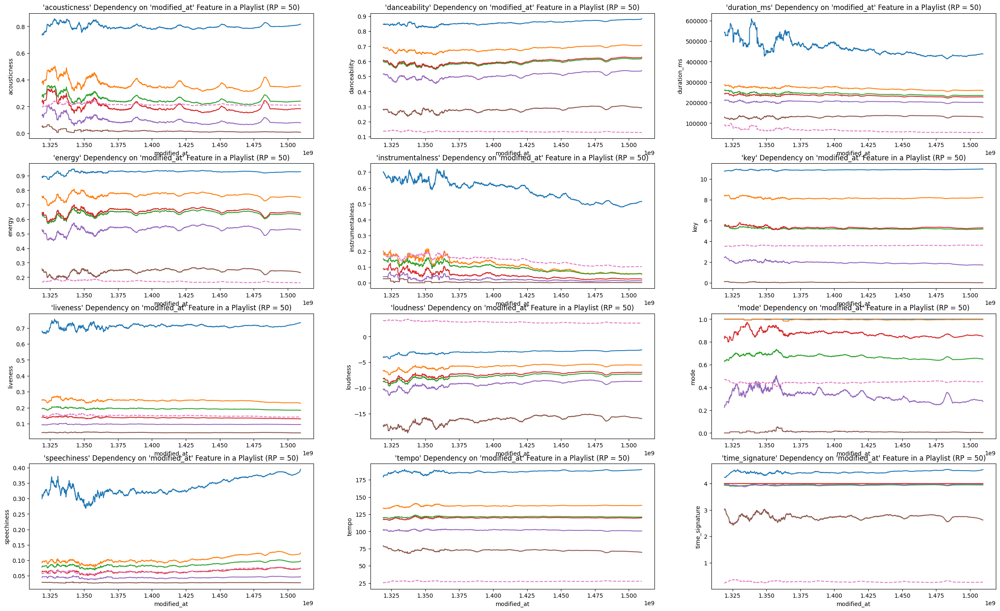

In [236]:
plot_dependency_table("modified_at", rolling_period = 50)

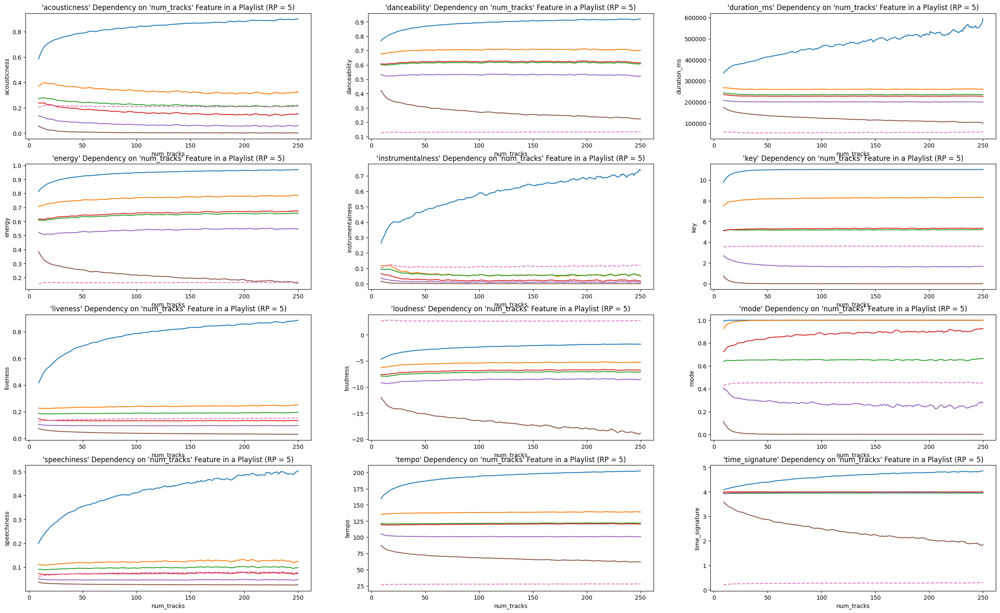

In [237]:
plot_dependency_table("num_tracks", rolling_period = 5)

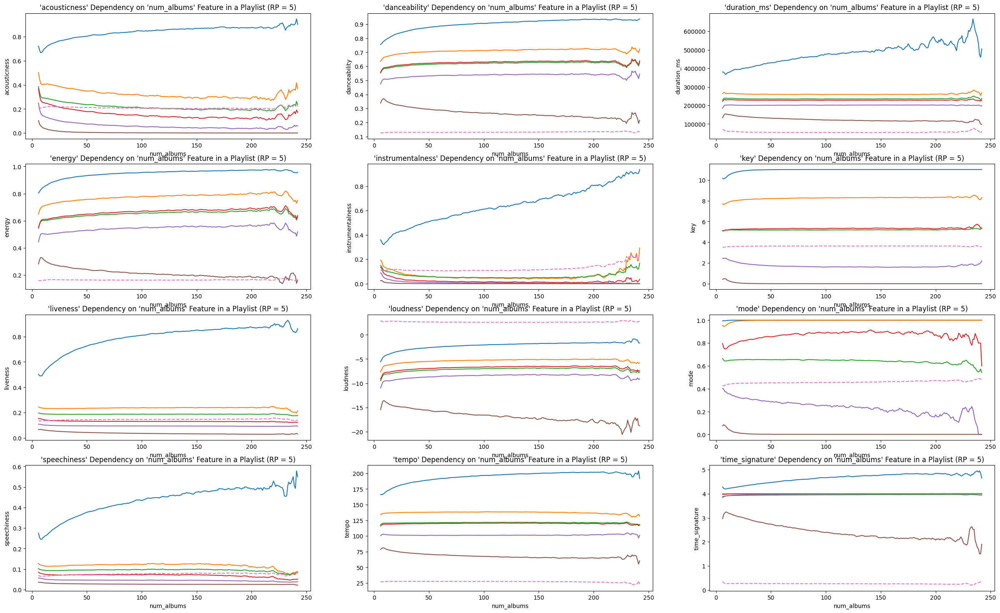

In [238]:
plot_dependency_table("num_albums", rolling_period = 5)

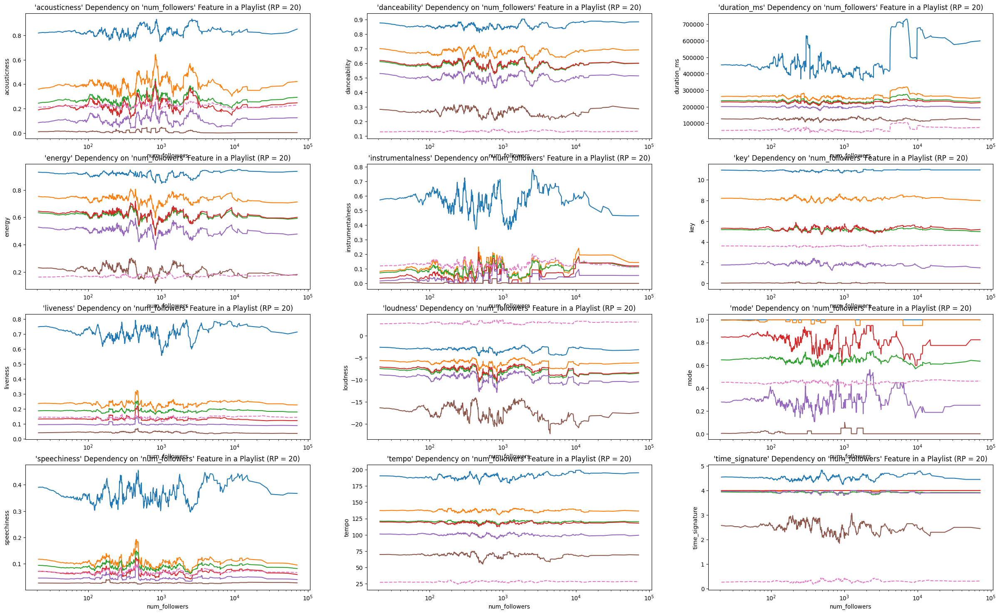

In [239]:
plot_dependency_table("num_followers", rolling_period = 20, x_log_scale = True)

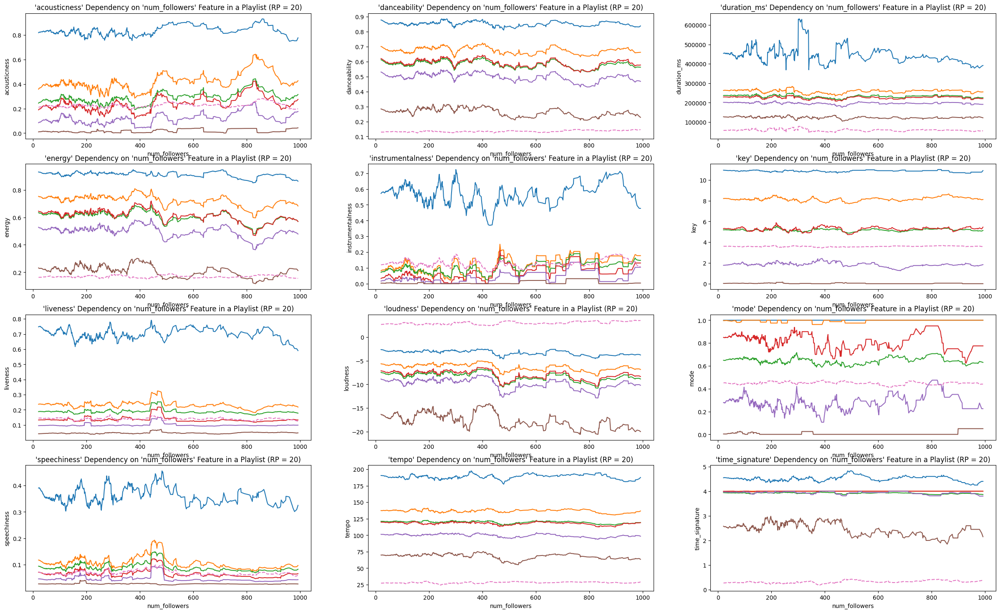

In [240]:
plot_dependency_table("num_followers", rolling_period = 20, max_value = 1000)

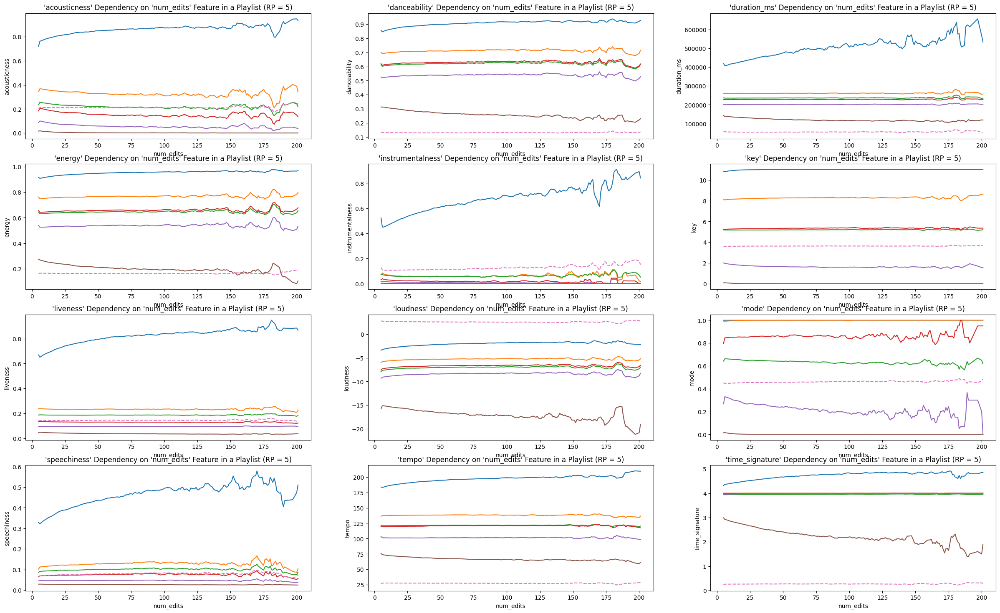

In [241]:
plot_dependency_table("num_edits", rolling_period = 5)

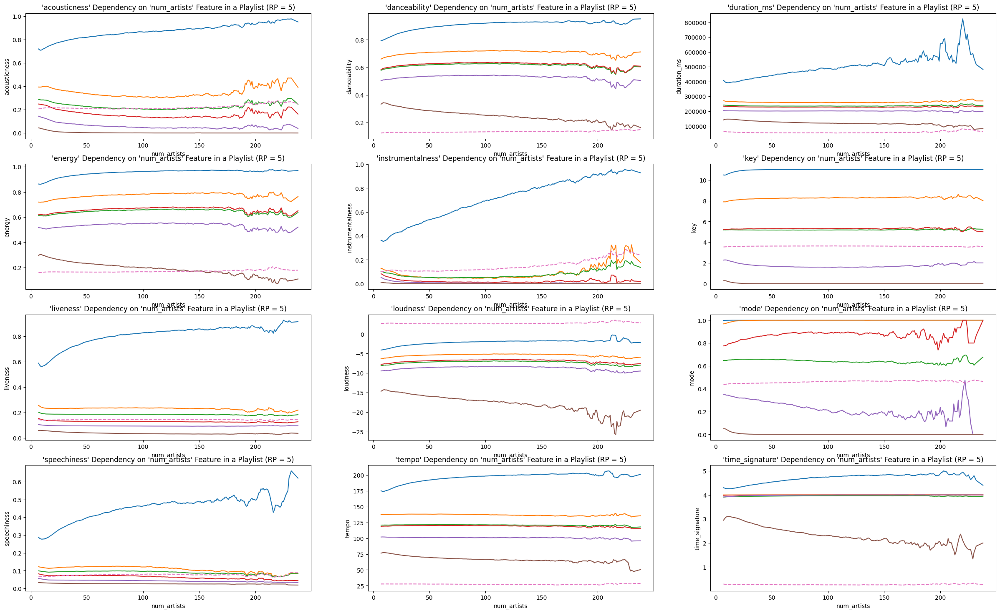

In [242]:
plot_dependency_table("num_artists", rolling_period = 5)

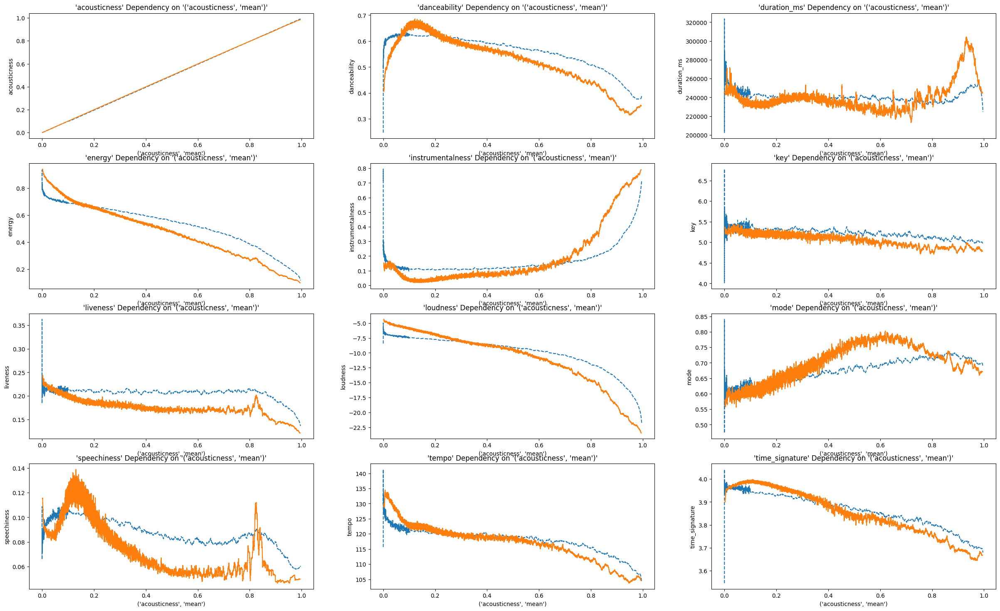

In [243]:
plot_playlist_existence_dependency_table(("acousticness", "mean"), rolling_period = 200, rolling_period_tracks = 10)

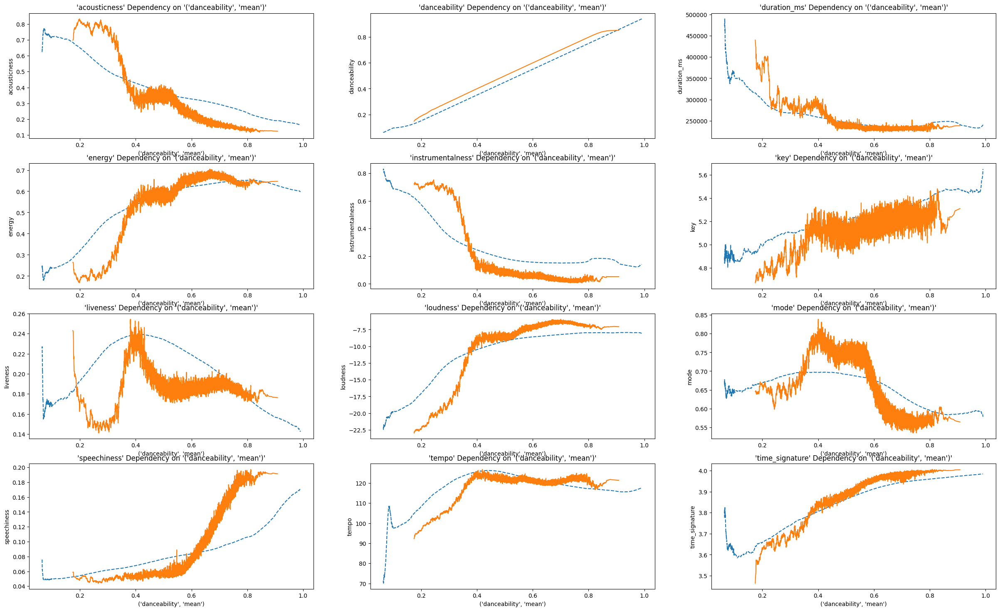

In [244]:
plot_playlist_existence_dependency_table(("danceability", "mean"), rolling_period = 100, rolling_period_tracks = 100)

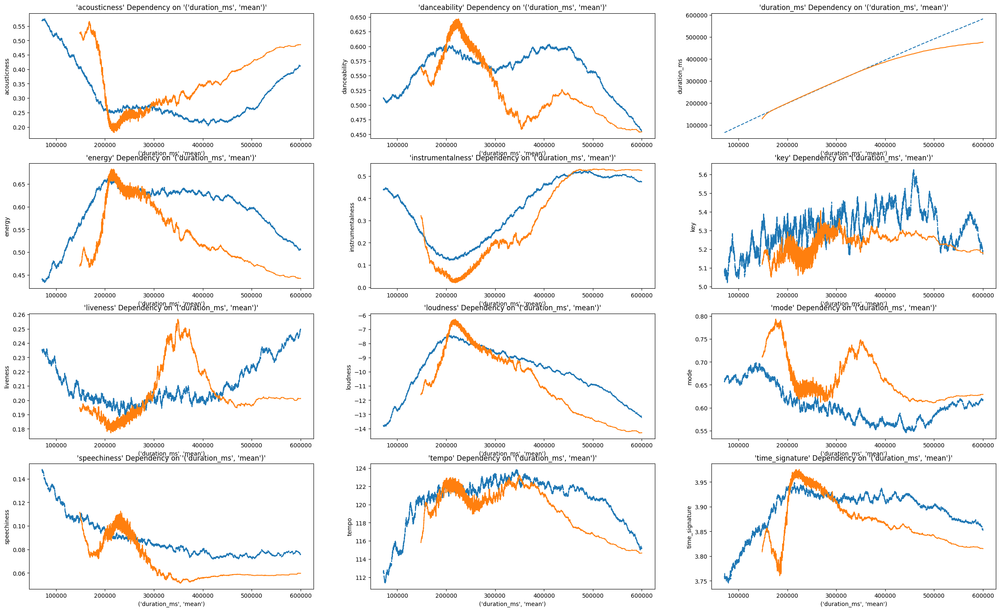

In [245]:
plot_playlist_existence_dependency_table(("duration_ms", "mean"), rolling_period = 500, rolling_period_tracks = 2500, min_value = 60000, max_value = 600000)

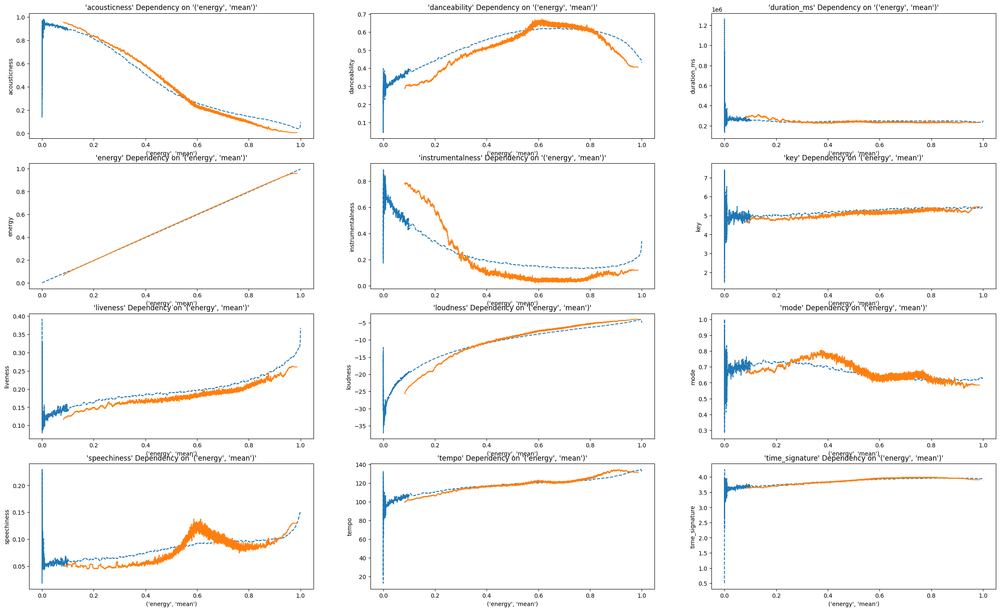

In [246]:
plot_playlist_existence_dependency_table(("energy", "mean"), rolling_period = 200, rolling_period_tracks = 10)

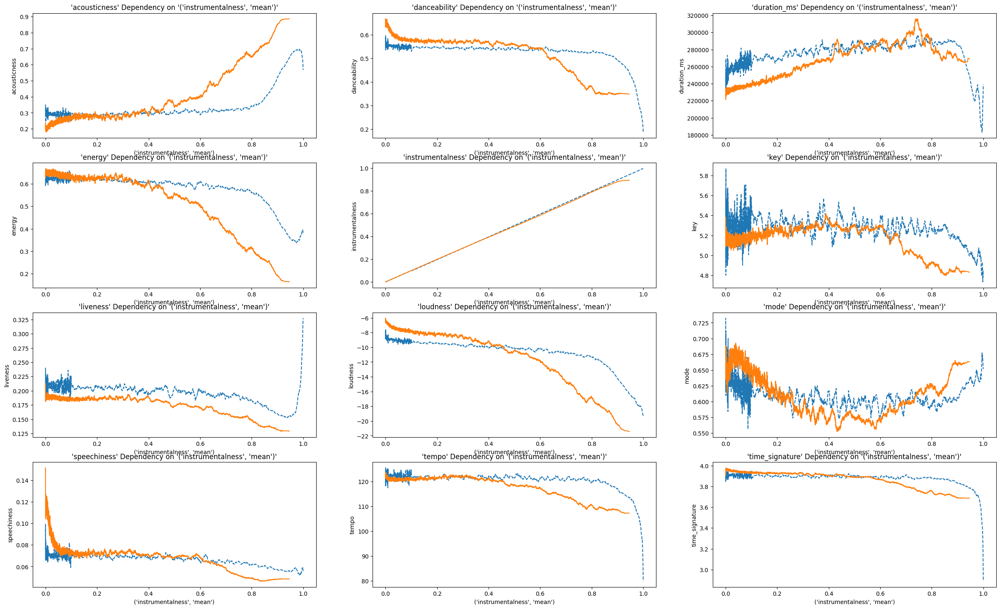

In [247]:
plot_playlist_existence_dependency_table(("instrumentalness", "mean"), rolling_period = 400, rolling_period_tracks = 10)

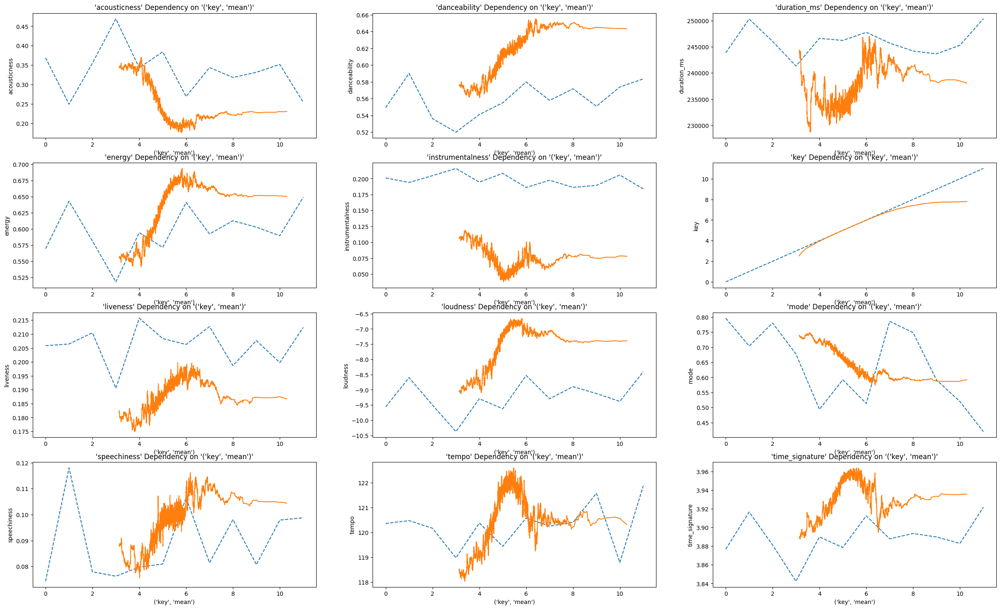

In [248]:
plot_playlist_existence_dependency_table(("key", "mean"), rolling_period = 200, rolling_period_tracks = 1)

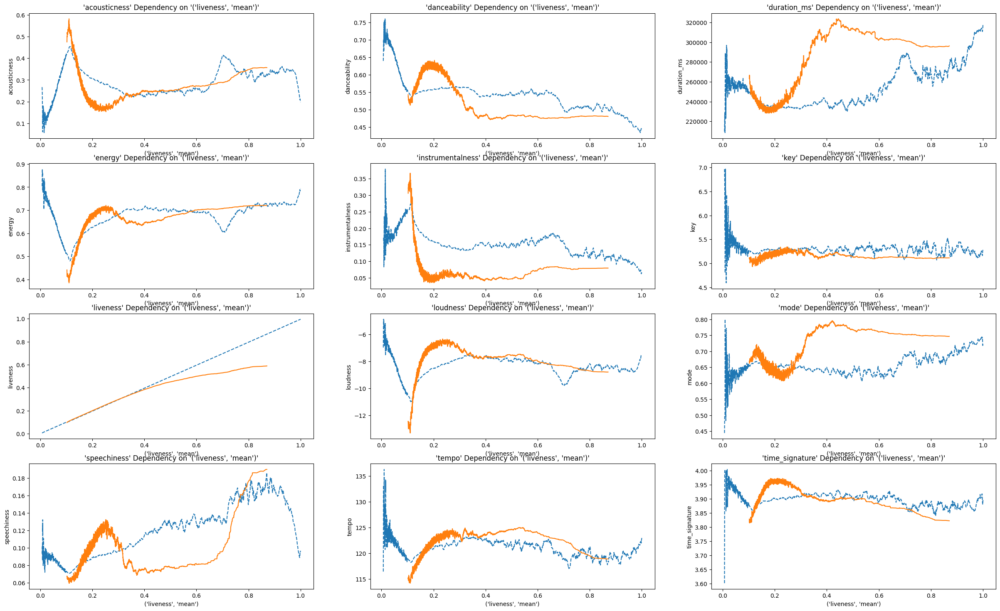

In [249]:
plot_playlist_existence_dependency_table(("liveness", "mean"), rolling_period = 400, rolling_period_tracks = 10)

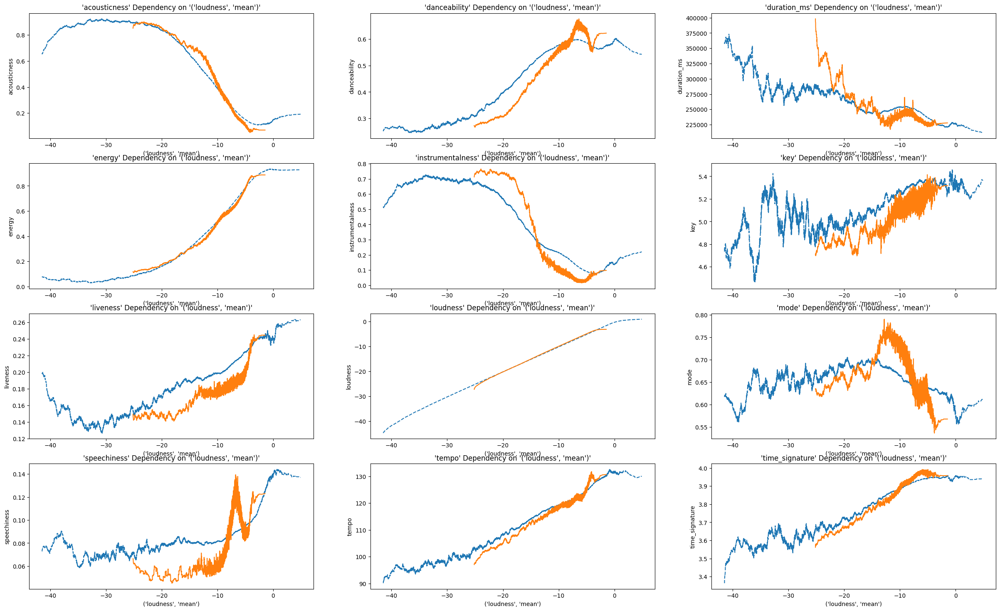

In [250]:
plot_playlist_existence_dependency_table(("loudness", "mean"), rolling_period = 200, rolling_period_tracks = 500)

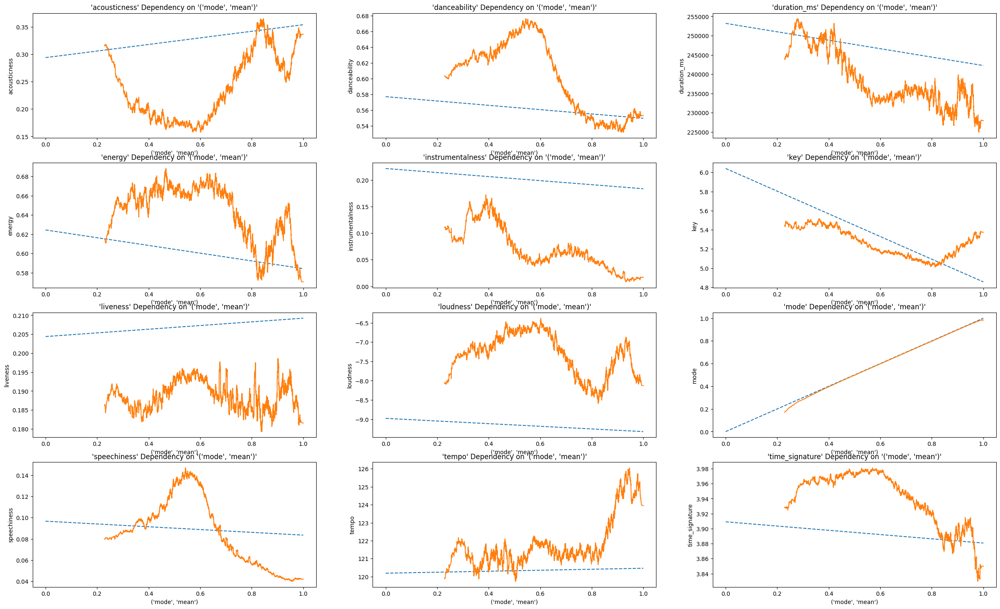

In [251]:
plot_playlist_existence_dependency_table(("mode", "mean"), rolling_period = 100, rolling_period_tracks = 1)

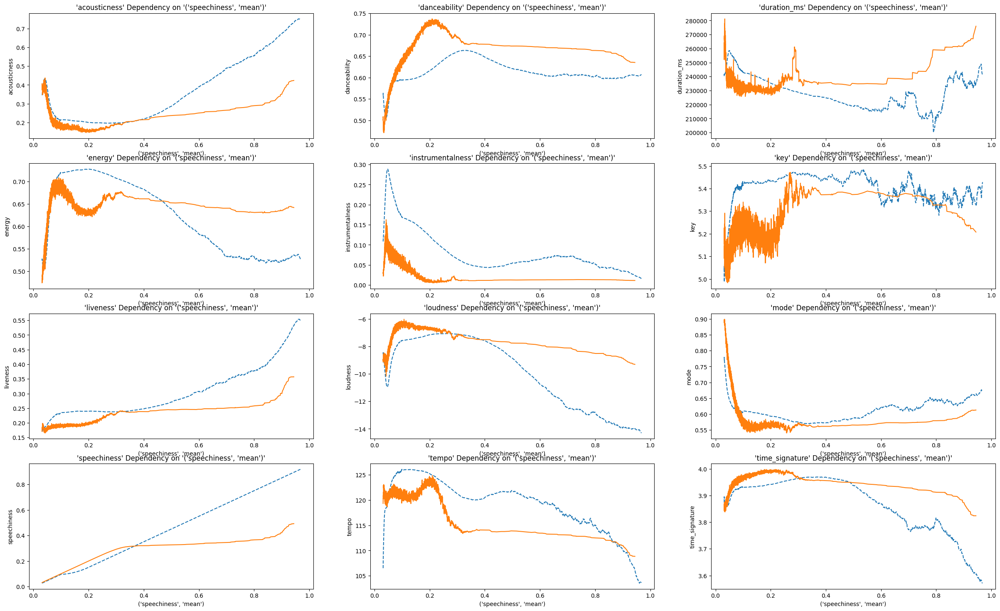

In [252]:
plot_playlist_existence_dependency_table(("speechiness", "mean"), rolling_period = 250, rolling_period_tracks = 100)

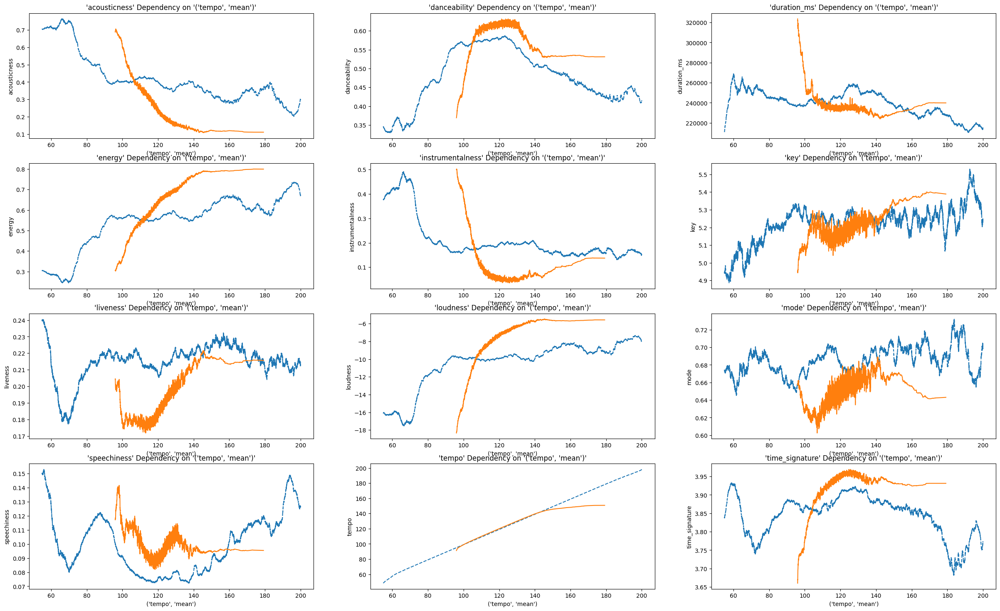

In [253]:
plot_playlist_existence_dependency_table(("tempo", "mean"), rolling_period = 500, rolling_period_tracks = 2000, max_value = 200)

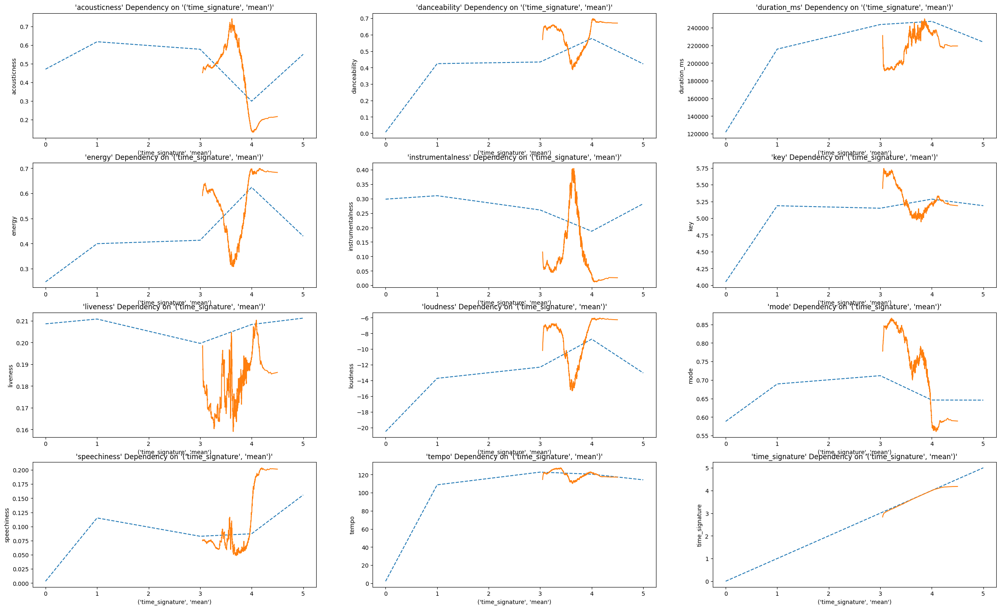

In [254]:
plot_playlist_existence_dependency_table(("time_signature", "mean"), rolling_period = 100, rolling_period_tracks = 1)

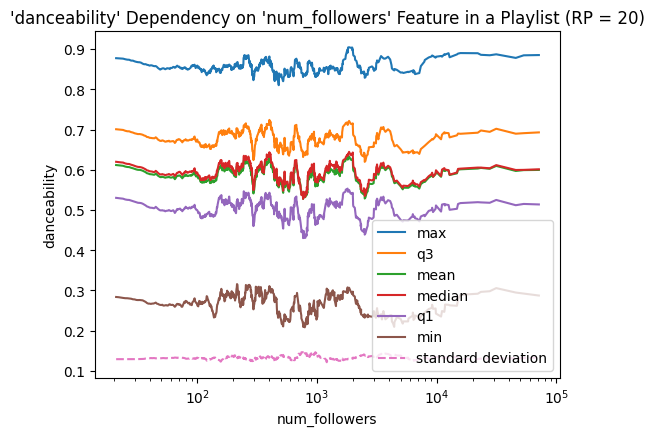

In [255]:
img, ax = plt.subplots(1, 1, figsize = (6, 4.5))
plot_trends("num_followers", "danceability", ax, rolling_period = 20, x_log_scale = True, save_to_file = True)

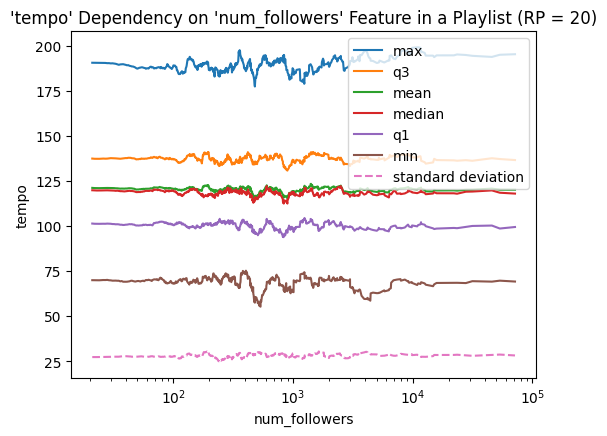

In [256]:
img, ax = plt.subplots(1, 1, figsize = (6, 4.5))
plot_trends("num_followers", "tempo", ax, rolling_period = 20, x_log_scale = True, save_to_file = True)

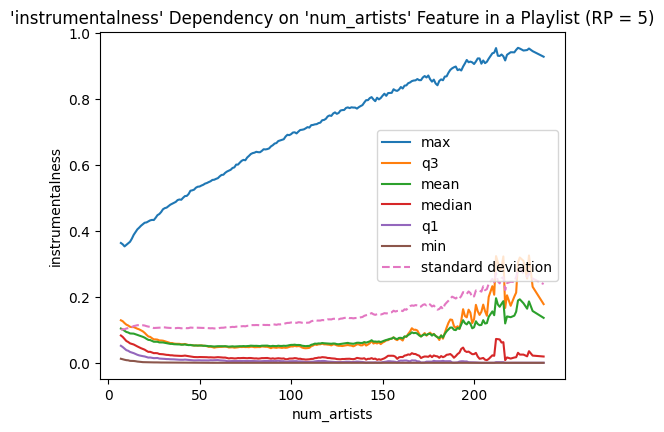

In [257]:
img, ax = plt.subplots(1, 1, figsize = (6, 4.5))
plot_trends("num_artists", "instrumentalness", ax, rolling_period = 5, save_to_file = True)

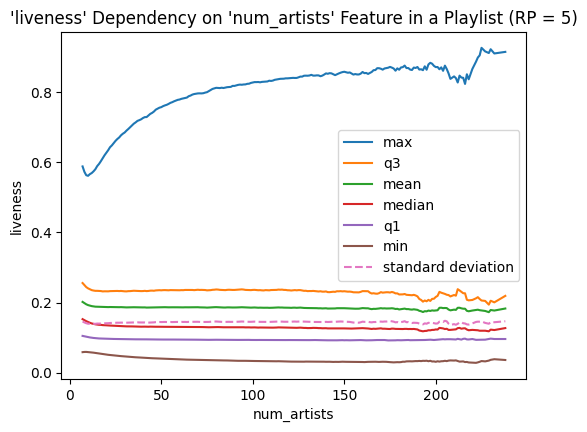

In [258]:
img, ax = plt.subplots(1, 1, figsize = (6, 4.5))
plot_trends("num_artists", "liveness", ax, rolling_period = 5, save_to_file = True)

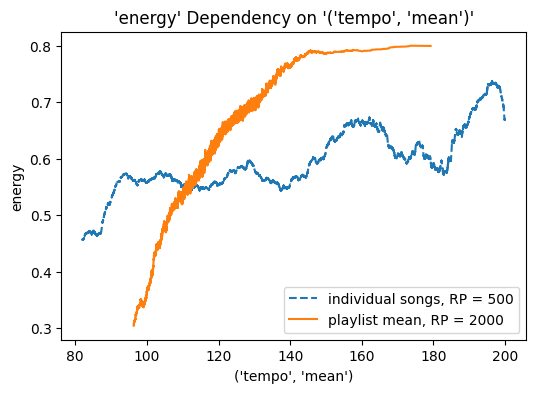

In [283]:
img, ax = plt.subplots(1, 1, figsize = (6, 4))
plot_playlist_existence_trend_comparison(("tempo", "mean"), "energy", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 80, max_value = 200, save_to_file = True)

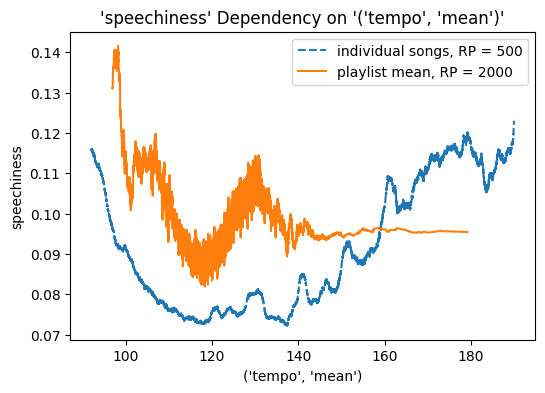

In [282]:
img, ax = plt.subplots(1, 1, figsize = (6, 4))
plot_playlist_existence_trend_comparison(("tempo", "mean"), "speechiness", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 90, max_value = 190, save_to_file = True)

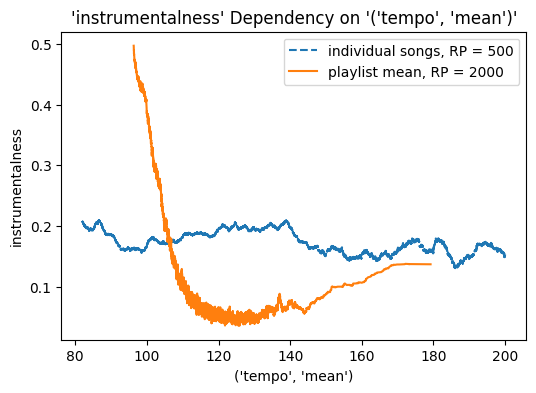

In [281]:
img, ax = plt.subplots(1, 1, figsize = (6, 4))
plot_playlist_existence_trend_comparison(("tempo", "mean"), "instrumentalness", ax, rolling_period = 500, rolling_period_tracks = 2000, min_value = 80, max_value = 200, save_to_file = True)

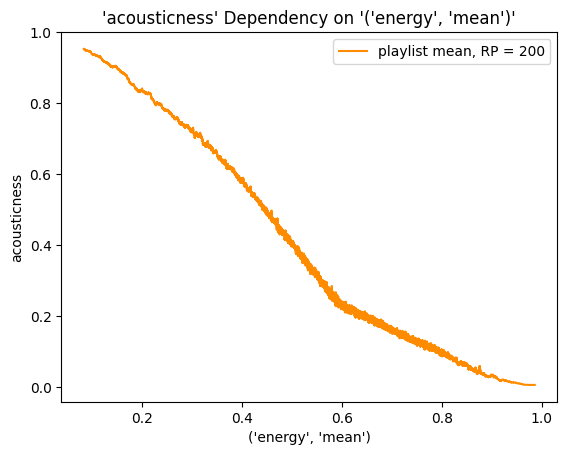

In [271]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("energy", "mean"), "acousticness", ax, rolling_period = 200, rolling_period_tracks = 200, save_to_file = True, min_value = 0.01, only_playlists = True)

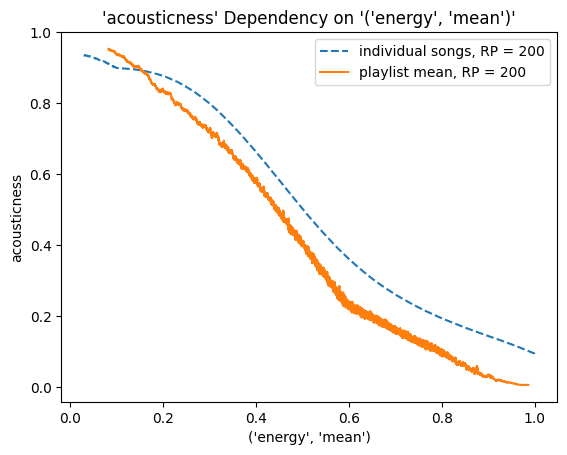

In [280]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("energy", "mean"), "acousticness", ax, rolling_period = 200, rolling_period_tracks = 200, save_to_file = True, min_value = 0.01)

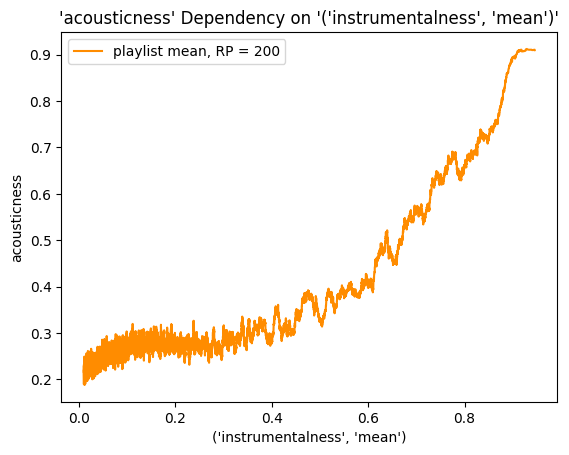

In [272]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("instrumentalness", "mean"), "acousticness", ax, rolling_period = 200, rolling_period_tracks = 200, save_to_file = True, min_value = 0.01, only_playlists = True)

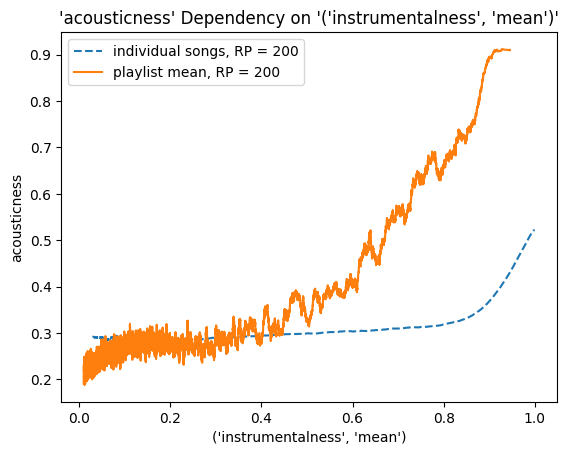

In [279]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("instrumentalness", "mean"), "acousticness", ax, rolling_period = 200, rolling_period_tracks = 200, save_to_file = True, min_value = 0.01)

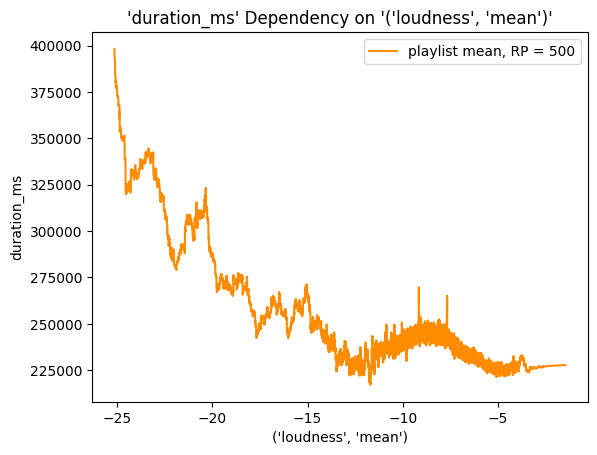

In [276]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("loudness", "mean"), "duration_ms", ax, rolling_period = 200, rolling_period_tracks = 500, save_to_file = True, only_playlists = True)

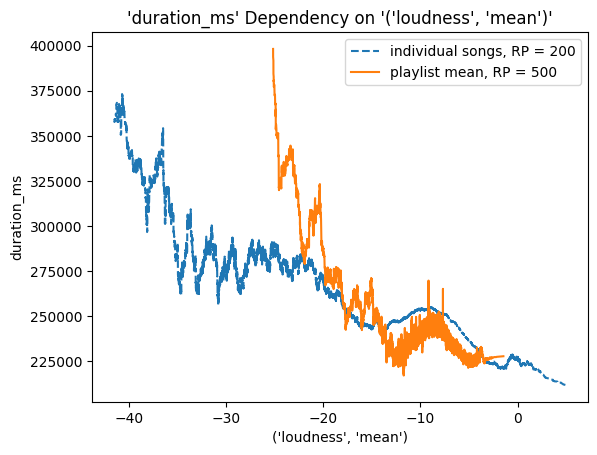

In [278]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("loudness", "mean"), "duration_ms", ax, rolling_period = 200, rolling_period_tracks = 500, save_to_file = True)

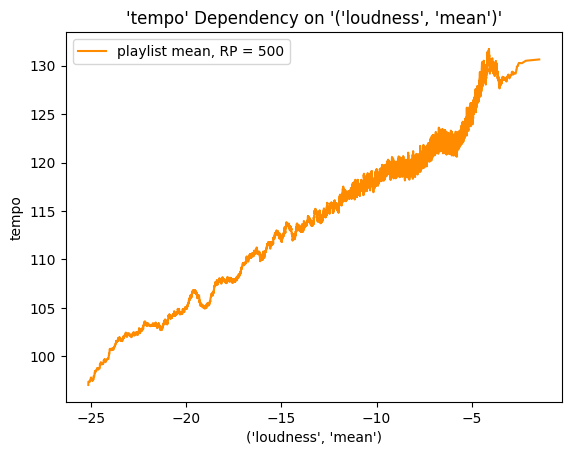

In [275]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("loudness", "mean"), "tempo", ax, rolling_period = 200, rolling_period_tracks = 500, save_to_file = True, only_playlists = True)

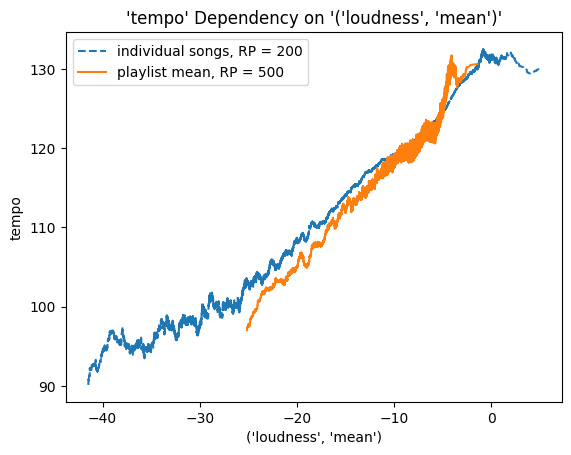

In [277]:
img, ax = plt.subplots(1, 1)
plot_playlist_existence_trend_comparison(("loudness", "mean"), "tempo", ax, rolling_period = 200, rolling_period_tracks = 500, save_to_file = True)